# **Análisis de datos del mercado de las criptomonedas**

### **Se tomarán como base para el análisis las 10 criptomonedas que ofrecieron mayor ganancia el último año conforme al movimiento de los precios**

## 1) Carga de datos desde la API de coingecko

In [8]:
import requests
import pandas as pd
from datetime import datetime, timedelta
from bs4 import BeautifulSoup


#### Aqui obtenemos los nombres de las monedas desde la watchlist top gainers y losers, vamos a necesitar los ids que son únicos que los tomaremos manualmente del drive de coingecko donde se enumeran todas las monedas con su nombre, id y symbol (en el repositorio nombrado como lista_coins)

In [9]:
import re
import requests
from bs4 import BeautifulSoup

# URL de la página
url = "https://www.coingecko.com/es/crypto-gainers-losers?time=y1&top=100"

# Realizar una solicitud GET a la página
response = requests.get(url)
soup = BeautifulSoup(response.text, "html.parser")

# Encontrar la tabla de ganadores
table = soup.find("table", class_="table")

# Lista para almacenar los nombres antes de los guiones
names = []

# Iterar a través de las filas de la tabla y extraer los nombres
for row in table.find_all("tr")[1:]:
    cells = row.find_all("td")
    if len(cells) > 1:
        symbol_full = cells[2].text.strip().replace("\n", "-")
        symbol_match = re.search(r'(.+?)---[A-Z]{3,5}', symbol_full)  # Capturar la parte antes de los guiones
        if symbol_match:
            name = symbol_match.group(1)
            names.append(name)

# Imprimir los nombres
print(names)


['Rollbit Coin', 'Kaspa', 'Injective', 'Bitget Token', 'Render', 'OKB', 'XDC Network', 'XRP', 'Bitcoin Cash', 'Litecoin', 'Wrapped Bitcoin', 'Bitcoin', 'GMX', 'Toncoin', 'Stacks', 'Maker', 'Tether Gold', 'TRON', 'Stellar', 'PAX Gold', 'Dogecoin', 'Casper Network', 'Dai']


In [11]:
from pycoingecko import CoinGeckoAPI
cg = CoinGeckoAPI()

In [58]:
# Tomamos las 10 primeras
coins_ids = ["rollbit-coin","kaspa","injective-protocol","bitget-token","render-token","okb","xdce-crowd-sale","ripple","bitcoin","litecoin"]

- Obtejenos los datos actuales de mercado de las 10 monedas seleccionadas a traves de una librería que está conectada con la API de coingecko, el resultado será un dataframe de 10 filas con la información actual de cada moneda (precio, market_cap, volumen de transacciones, etc)

In [383]:
data = cg.get_coins_markets(ids=coins_ids,vs_currency="usd")

# Crear un DataFrame a partir de los datos
market_df = pd.DataFrame(data)


#### Existe también un get en la API para obtener las categorías a las que pertenece cada moneda, vamos a mapearlas y agregarlas al dataframe ya creado de la info actual de mercado

In [384]:
# Crear una lista para mapear coin_id a su categoría
coin_category_map = []

# Obtener información de cada moneda individualmente y mapear a su categoría
for coin_id in coins_ids:
    try:
        coin_info = cg.get_coin_by_id(id=coin_id, vs_currency="usd")
        coin_category_map.append((coin_id, coin_info.get('categories', [])))
    except Exception as e:
        print(f"Error al obtener información de {coin_id}: {e}")
        coin_category_map.append((coin_id, []))

# Crear un DataFrame a partir de la lista
category_df = pd.DataFrame(coin_category_map, columns=['coin_id', 'categories'])

# Combinar el DataFrame de mercado con el DataFrame de categorías
market = pd.merge(market_df, category_df, left_on='id', right_on='coin_id')

In [385]:
market.head()

,id,symbol,name,image,current_price,market_cap,market_cap_rank,fully_diluted_valuation,total_volume,high_24h,...,ath,ath_change_percentage,ath_date,atl,atl_change_percentage,atl_date,roi,last_updated,coin_id,categories
0,bitcoin,btc,Bitcoin,https://assets.coingecko.com/coins/images/1/la...,"29,371.00",571204167904,1,616489743028,13223734000,"29,653.00",...,"69,045.00",-57.48,2021-11-10T14:24:11.849Z,67.81,"43,194.31",2013-07-06T00:00:00.000Z,None,2023-08-14T21:48:24.584Z,bitcoin,"[Layer 1 (L1), Cryptocurrency]"
1,ripple,xrp,XRP,https://assets.coingecko.com/coins/images/44/l...,0.63,33264699086,5,63016499958,989972463,0.63,...,3.40,-81.46,2018-01-07T00:00:00.000Z,0.00,"23,357.74",2014-05-22T00:00:00.000Z,None,2023-08-14T21:48:21.816Z,ripple,[Cryptocurrency]
2,litecoin,ltc,Litecoin,https://assets.coingecko.com/coins/images/2/la...,82.19,6039217154,15,6898011757,361490066,82.96,...,410.26,-79.98,2021-05-10T03:13:07.904Z,1.15,"7,047.58",2015-01-14T00:00:00.000Z,None,2023-08-14T21:48:23.295Z,litecoin,[Cryptocurrency]
3,okb,okb,OKB,https://assets.coingecko.com/coins/images/4463...,47.11,2828230742,27,14141153711,4348520,47.22,...,58.66,-19.63,2023-02-18T01:21:37.582Z,0.58,"8,019.40",2019-01-14T00:00:00.000Z,None,2023-08-14T21:48:26.151Z,okb,"[Ethereum Ecosystem, Centralized Exchange (CEX..."
4,xdce-crowd-sale,xdc,XDC Network,https://assets.coingecko.com/coins/images/2912...,0.06,860988424,48,2352286449,15046476,0.07,...,0.19,-67.76,2021-08-21T04:39:48.324Z,0.00,"15,619.14",2019-07-22T00:00:00.000Z,"{'times': 3.494384978980794, 'currency': 'eth'...",2023-08-14T21:48:17.015Z,xdce-crowd-sale,"[XDC Ecosystem, Ethereum Ecosystem, Smart Cont..."


#### Obtenemos datos históricos de mercado (a 5 años) de las 10 monedas, en este caso tendremos un dataframe en donde se muestre la información de mercacado diaria de cada moneda (precio, market_cap y volumen de transacciones)

In [308]:
start_date = datetime.strptime("2018-08-01", "%Y-%m-%d")
end_date = datetime.strptime("2023-08-01", "%Y-%m-%d")

In [225]:
start_timestamp = int(start_date.timestamp())
end_timestamp = int(end_date.timestamp())

In [309]:
coins_ids = ["rollbit-coin","kaspa","injective-protocol","bitget-token","render-token","okb","xdce-crowd-sale","ripple","bitcoin","litecoin"]

historical_data_dict = {}

for coin_id in coins_ids:
    try:
        historical_data = cg.get_coin_market_chart_range_by_id(
            id=coin_id,
            from_timestamp=start_timestamp,
            to_timestamp=end_timestamp,
            vs_currency="usd")
        historical_data_dict[coin_id] = historical_data
        print(f"Datos de {coin_id} obtenidos exitosamente.")
    except Exception as e:
        print(f"Error al obtener datos de {coin_id}: {e}")


Datos de rollbit-coin obtenidos exitosamente.
Datos de kaspa obtenidos exitosamente.
Datos de injective-protocol obtenidos exitosamente.
Datos de bitget-token obtenidos exitosamente.
Datos de render-token obtenidos exitosamente.
Datos de okb obtenidos exitosamente.
Datos de xdce-crowd-sale obtenidos exitosamente.
Datos de ripple obtenidos exitosamente.
Datos de bitcoin obtenidos exitosamente.
Datos de litecoin obtenidos exitosamente.


In [227]:
# Revisamos cuales son los keys del diccionario para poder transformarlo a dataframe
data_keys = set()
for data in historical_data_dict.values():
    data_keys.update(data.keys())

print("Claves en los diccionarios:", data_keys)

Claves en los diccionarios: {'prices', 'market_caps', 'total_volumes'}


#### Crearé un dataframe general, en donde se guarde la información de todas las monedas y un diccionario de dataframes donde podremos encontrar cada moneda en particular accediendo con la key=id_coin

In [310]:
# Crear un diccionario de DataFrames para poder ingresar al df de cada moneda con su id
dfs_by_coin = {}

for coin_id, data in historical_data_dict.items():
    coin_df = pd.DataFrame(data['prices'], columns=['timestamp', 'price'])
    coin_df['timestamp'] = pd.to_datetime(coin_df['timestamp'], unit='ms')
    
    # Agregar las columnas adicionales
    market_cap_data = data['market_caps']
    volume_data = data['total_volumes']
    
    coin_df['market_cap'] = [item[1] for item in market_cap_data]
    coin_df['volume'] = [item[1] for item in volume_data]
    
    dfs_by_coin[coin_id] = coin_df


In [311]:
dfs_by_coin['bitcoin']

,timestamp,price,market_cap,volume
0,2018-08-02,"7,612.30","130,813,483,341.76","11,591,125,727.42"
1,2018-08-03,"7,540.63","129,596,337,579.77","6,834,800,615.47"
2,2018-08-04,"7,411.67","127,395,242,323.66","5,580,835,718.27"
3,2018-08-05,"7,009.01","120,489,906,899.29","5,952,900,997.75"
4,2018-08-06,"7,036.61","120,977,961,419.31","5,989,412,029.07"
...,...,...,...,...
1821,2023-07-28,"29,200.24","567,708,714,251.76","9,047,649,539.81"
1822,2023-07-29,"29,314.10","569,952,119,667.40","7,682,754,827.05"
1823,2023-07-30,"29,356.75","570,804,910,032.57","4,882,536,540.91"
1824,2023-07-31,"29,277.76","569,135,711,632.85","7,872,881,636.63"


In [312]:
# Crear un DataFrame con todas las monedas
all_coins = pd.DataFrame()

for coin_id, data in historical_data_dict.items():
    coin_df = pd.DataFrame(data['prices'], columns=['timestamp', f'{coin_id}_price'])
    coin_df['timestamp'] = pd.to_datetime(coin_df['timestamp'], unit='ms')

    # Agregar información de capitalización de mercado y volumen
    market_cap_data = data['market_caps']
    volume_data = data['total_volumes']
    
    market_cap_df = pd.DataFrame(market_cap_data, columns=['timestamp', f'{coin_id}_market_cap'])
    market_cap_df['timestamp'] = pd.to_datetime(market_cap_df['timestamp'], unit='ms')
    
    volume_df = pd.DataFrame(volume_data, columns=['timestamp', f'{coin_id}_volume'])
    volume_df['timestamp'] = pd.to_datetime(volume_df['timestamp'], unit='ms')
    
    # Realizar merge de los DataFrames de precios, capitalización de mercado y volumen
    coin_df = pd.merge(coin_df, market_cap_df, on='timestamp', how='outer')
    coin_df = pd.merge(coin_df, volume_df, on='timestamp', how='outer')
    
    # Realizar merge con el DataFrame general
    if all_coins.empty:
        all_coins = coin_df
    else:
        all_coins = pd.merge(all_coins_df, coin_df, on='timestamp', how='outer')


In [315]:
all_coins.head()

,timestamp,rollbit-coin_price,rollbit-coin_market_cap,rollbit-coin_volume,kaspa_price,kaspa_market_cap,kaspa_volume,injective-protocol_price,injective-protocol_market_cap,injective-protocol_volume,...,ripple_volume,bitcoin_price,bitcoin_market_cap,bitcoin_volume,litecoin_price_x,litecoin_market_cap_x,litecoin_volume_x,litecoin_price_y,litecoin_market_cap_y,litecoin_volume_y
0,2022-03-24,0.00,0.00,"33,417.59",NaN,NaN,NaN,5.62,"273,015,506.72","20,298,535.56",...,"3,256,620,136.10","42,802.15","810,894,331,277.66","21,851,891,598.64",122.31,"8,551,817,227.79","694,876,456.99",122.31,"8,551,817,227.79","694,876,456.99"
1,2022-03-25,0.00,0.00,"33,417.59",NaN,NaN,NaN,5.96,"289,858,833.26","33,219,701.28",...,"2,788,824,891.43","43,936.10","834,251,096,724.51","26,212,783,703.86",126.94,"8,889,688,945.56","817,339,754.74",126.94,"8,889,688,945.56","817,339,754.74"
2,2022-03-26,0.00,0.00,"14,766.21",NaN,NaN,NaN,5.74,"279,183,099.82","25,396,010.38",...,"1,983,331,996.35","44,331.78","842,031,938,721.79","26,147,756,108.08",124.04,"8,673,709,383.39","699,156,200.58",124.04,"8,673,709,383.39","699,156,200.58"
3,2022-03-27,0.00,0.00,"31,947.18",NaN,NaN,NaN,5.83,"283,394,481.85","11,525,087.47",...,"1,421,460,060.38","44,510.84","845,235,093,872.76","13,676,534,294.23",124.69,"8,720,005,503.92","424,690,663.13",124.69,"8,720,005,503.92","424,690,663.13"
4,2022-03-28,0.00,0.00,"33,162.76",NaN,NaN,NaN,6.09,"296,745,504.13","30,724,782.18",...,"1,855,295,728.81","46,715.12","887,283,025,181.13","22,545,392,529.67",129.13,"9,017,530,687.70","628,570,175.56",129.13,"9,017,530,687.70","628,570,175.56"


## 2) Análisis exploratorio de datos (EDA)

#### Primero definimos algunos conceptos para nuestro entendimiento:

market_cap: es la capitalización de mercado de la moneda, el valor de la misma en el momento actual. Es el producto de el precio por la cantidad en un momento dado

market_cap_rank: es la posición que ocupa una criptomoneda en el mercado según su capitalización

fully_diluted_valuation: La capitalización de mercado completamente diluida es una forma de medir el valor total de una criptomoneda. Esto analiza cuánto valdría cada moneda si todas las monedas futuras estuvieran en circulación. Por ejemplo, con Bitcoin , la cantidad máxima de monedas que se pueden crear se establece en 21 millones.

circulating_supply: El suministro circulante es la mejor aproximación del número de monedas que están circulando en el Mercado y en las manos del público en general. En el futuro pueden haber más unidades, pero ahora mismo hay las que hay.

total_supply: Significa el número total de monedas generadas en la red independientemente de si estas están o no en el mercado. Esto es así ya que en muchas ocasiones, no están todas las criptomonedas o todos los tokens ya en el mercado, si no que como por ejemplo pasa con Bitcoin, se van desbloqueando con el paso del tiempo gracias al minado. En ese caso, el circulating supply y el Total Supply sería distinto.

max_supply: Vendría a ser lo mismo que el suministro total, solo que el máximo,muestra los orígenes. Por ejemplo, Shiba nació con 1000 Billones de tokens. En estos momentos puede tener un total supply de 350 Billones ¿Por qué? Por que se han quemado muchos de sus tokens. Es decir, los que existen a día de hoy, son esos 350 billones, pero su Max supply sería 1000 Billones, que es el máximo que ha tenido .

ATH: se refiere a las siglas en inglés de “All Time High”, lo cual representa el Precio más Alto de Todos los Tiempos.

ATL: se refiere a las siglas en inglés de “All Time Low”, lo cual representa el Precio más Bajo de Todos los Tiempos.

ROI: retorno de la inversión

#### Eliminamos columnas innecesarias o que no aportan valor al análisis

In [386]:
market.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 28 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                10 non-null     object 
 1   symbol                            10 non-null     object 
 2   name                              10 non-null     object 
 3   image                             10 non-null     object 
 4   current_price                     10 non-null     float64
 5   market_cap                        10 non-null     int64  
 6   market_cap_rank                   10 non-null     int64  
 7   fully_diluted_valuation           10 non-null     int64  
 8   total_volume                      10 non-null     int64  
 9   high_24h                          10 non-null     float64
 10  low_24h                           10 non-null     float64
 11  price_change_24h                  10 non-null     float64
 12  price_chang

In [387]:
column_names = market.columns
print(column_names)


Index(['id', 'symbol', 'name', 'image', 'current_price', 'market_cap',
       'market_cap_rank', 'fully_diluted_valuation', 'total_volume',
       'high_24h', 'low_24h', 'price_change_24h',
       'price_change_percentage_24h', 'market_cap_change_24h',
       'market_cap_change_percentage_24h', 'circulating_supply',
       'total_supply', 'max_supply', 'ath', 'ath_change_percentage',
       'ath_date', 'atl', 'atl_change_percentage', 'atl_date', 'roi',
       'last_updated', 'coin_id', 'categories'],
      dtype='object')


In [388]:
market

,id,symbol,name,image,current_price,market_cap,market_cap_rank,fully_diluted_valuation,total_volume,high_24h,...,ath,ath_change_percentage,ath_date,atl,atl_change_percentage,atl_date,roi,last_updated,coin_id,categories
0,bitcoin,btc,Bitcoin,https://assets.coingecko.com/coins/images/1/la...,"29,371.00",571204167904,1,616489743028,13223734000,"29,653.00",...,"69,045.00",-57.48,2021-11-10T14:24:11.849Z,67.81,"43,194.31",2013-07-06T00:00:00.000Z,None,2023-08-14T21:48:24.584Z,bitcoin,"[Layer 1 (L1), Cryptocurrency]"
1,ripple,xrp,XRP,https://assets.coingecko.com/coins/images/44/l...,0.63,33264699086,5,63016499958,989972463,0.63,...,3.40,-81.46,2018-01-07T00:00:00.000Z,0.00,"23,357.74",2014-05-22T00:00:00.000Z,None,2023-08-14T21:48:21.816Z,ripple,[Cryptocurrency]
2,litecoin,ltc,Litecoin,https://assets.coingecko.com/coins/images/2/la...,82.19,6039217154,15,6898011757,361490066,82.96,...,410.26,-79.98,2021-05-10T03:13:07.904Z,1.15,"7,047.58",2015-01-14T00:00:00.000Z,None,2023-08-14T21:48:23.295Z,litecoin,[Cryptocurrency]
3,okb,okb,OKB,https://assets.coingecko.com/coins/images/4463...,47.11,2828230742,27,14141153711,4348520,47.22,...,58.66,-19.63,2023-02-18T01:21:37.582Z,0.58,"8,019.40",2019-01-14T00:00:00.000Z,None,2023-08-14T21:48:26.151Z,okb,"[Ethereum Ecosystem, Centralized Exchange (CEX..."
4,xdce-crowd-sale,xdc,XDC Network,https://assets.coingecko.com/coins/images/2912...,0.06,860988424,48,2352286449,15046476,0.07,...,0.19,-67.76,2021-08-21T04:39:48.324Z,0.00,"15,619.14",2019-07-22T00:00:00.000Z,"{'times': 3.494384978980794, 'currency': 'eth'...",2023-08-14T21:48:17.015Z,xdce-crowd-sale,"[XDC Ecosystem, Ethereum Ecosystem, Smart Cont..."
5,kaspa,kas,Kaspa,https://assets.coingecko.com/coins/images/2575...,0.04,834899907,49,1189044378,14765260,0.04,...,0.05,-19.94,2023-08-06T12:10:40.416Z,0.00,"24,104.49",2022-05-26T14:42:59.316Z,None,2023-08-14T21:48:13.994Z,kaspa,[Layer 1 (L1)]
6,injective-protocol,inj,Injective,https://assets.coingecko.com/coins/images/1288...,7.58,634753020,66,757863779,25427586,7.75,...,24.89,-69.56,2021-04-30T00:33:02.969Z,0.66,"1,052.39",2020-11-03T16:19:30.576Z,None,2023-08-14T21:48:26.967Z,injective-protocol,"[Binance Launchpad, Layer 1 (L1), Avalanche Ec..."
7,bitget-token,bgb,Bitget Token,https://assets.coingecko.com/coins/images/1161...,0.45,634368689,67,906240337,14257223,0.46,...,0.52,-12.10,2023-02-16T08:52:49.445Z,0.01,"3,073.14",2020-06-25T04:17:05.895Z,None,2023-08-14T21:48:06.100Z,bitget-token,"[Centralized Exchange (CEX), Exchange-based To..."
8,render-token,rndr,Render,https://assets.coingecko.com/coins/images/1163...,1.71,633152142,68,909649360,23520902,1.76,...,8.78,-80.50,2021-11-21T10:03:19.097Z,0.04,"4,572.63",2020-06-16T13:22:25.900Z,None,2023-08-14T21:48:23.168Z,render-token,"[DePIN, Artificial Intelligence (AI), Ethereum..."
9,rollbit-coin,rlb,Rollbit Coin,https://assets.coingecko.com/coins/images/2455...,0.19,622354919,69,943833866,15637408,0.19,...,0.21,-11.96,2023-08-12T14:31:00.633Z,0.00,"19,963.83",2022-07-02T02:46:34.730Z,None,2023-08-14T21:48:22.518Z,rollbit-coin,"[Ethereum Ecosystem, Solana Ecosystem, Gambling]"


In [389]:
eliminar_market = ['symbol', 'name', 'image', "last_updated","coin_id","roi"]
market.drop(columns=eliminar_market, inplace=True)

In [390]:
# Cambiamos los nombres para mejorar su lectura
nuevos_nombres = {'fully_diluted_valuation': 'FDV', 'current_price': 'price', "total_volume":"volume","price_change_percentage_24h":"price_change_24h%",'market_cap_change_percentage_24h':'market_cap_change_24h%','ath_change_percentage':'ath_change%','atl_change_percentage':'atl_change%'}
market.rename(columns=nuevos_nombres, inplace=True)

Del dataframe market se eliminaron las columnas symbol, name, image y coin_id ya que nos alcanza con tener el id. También se eleminó roi ya que el 90% de la columna está vacia. Y por último last_updated ya que en esta primera instancia se trabajará con los datos actuales en una fecha específica sin actualizarlos

In [391]:
column_names = all_coins.columns
print(column_names)

Index(['fecha', 'rollbit-coin_price', 'rollbit-coin_market_cap',
       'rollbit-coin_volume', 'kaspa_price', 'kaspa_market_cap',
       'kaspa_volume', 'injective-protocol_price',
       'injective-protocol_market_cap', 'injective-protocol_volume',
       'bitget-token_price', 'bitget-token_market_cap', 'bitget-token_volume',
       'render-token_price', 'render-token_market_cap', 'render-token_volume',
       'okb_price', 'okb_market_cap', 'okb_volume', 'xdce-crowd-sale_price',
       'xdce-crowd-sale_market_cap', 'xdce-crowd-sale_volume', 'ripple_price',
       'ripple_market_cap', 'ripple_volume', 'bitcoin_price',
       'bitcoin_market_cap', 'bitcoin_volume', 'litecoin_price_x',
       'litecoin_market_cap_x', 'litecoin_volume_x'],
      dtype='object')


In [ ]:
eliminar_allcoins = ['litecoin_price_y','litecoin_market_cap_y','litecoin_volume_y']
all_coins.drop(columns=eliminar_allcoins, inplace=True)

In [319]:
# Cambiamos los nombres para mejorar su lectura
cambio = {'timestamp':'fecha'}
all_coins.rename(columns=cambio, inplace=True)

Nos interesan todas las columnas del dataframe all_coins, solo eliminaremos 'litecoin_price_y','litecoin_market_cap_y', 
que están repetidas

In [320]:
# Renombramos la columna timestamp en el diccionario de dataframes por moneda para mejorar la lectura
cambio2 = {'timestamp': 'fecha'}

for coin_id, coin_df in dfs_by_coin.items():
    coin_df.rename(columns=cambio2, inplace=True)

#### A continuación cambiaré los tipos de datos de las columnas necesarias ya que con object no podemos crear visualizaciones para ver patrones en los datos. Vemos que todas las columnas son de tipo numérica y unas pocas de fecha.

 Comenzamos con las columnas de fecha:

In [393]:
market["atl_date"].unique()

array(['2013-07-06T00:00:00.000Z', '2014-05-22T00:00:00.000Z',
       '2015-01-14T00:00:00.000Z', '2019-01-14T00:00:00.000Z',
       '2019-07-22T00:00:00.000Z', '2022-05-26T14:42:59.316Z',
       '2020-11-03T16:19:30.576Z', '2020-06-25T04:17:05.895Z',
       '2020-06-16T13:22:25.900Z', '2022-07-02T02:46:34.730Z'],
      dtype=object)

In [394]:
market["ath_date"].unique()

array(['2021-11-10T14:24:11.849Z', '2018-01-07T00:00:00.000Z',
       '2021-05-10T03:13:07.904Z', '2023-02-18T01:21:37.582Z',
       '2021-08-21T04:39:48.324Z', '2023-08-06T12:10:40.416Z',
       '2021-04-30T00:33:02.969Z', '2023-02-16T08:52:49.445Z',
       '2021-11-21T10:03:19.097Z', '2023-08-12T14:31:00.633Z'],
      dtype=object)

In [404]:
market['ath_date'] = pd.to_datetime(market['ath_date'])
market['atl_date'] = pd.to_datetime(market['atl_date'])

No hacen falta hacer cambios en las columnas del dataframe all_coins porque están todas correctas

In [396]:
all_coins.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   fecha                          1826 non-null   datetime64[ns]
 1   rollbit-coin_price             1826 non-null   float64       
 2   rollbit-coin_market_cap        1826 non-null   float64       
 3   rollbit-coin_volume            1826 non-null   float64       
 4   kaspa_price                    1826 non-null   float64       
 5   kaspa_market_cap               1826 non-null   float64       
 6   kaspa_volume                   1826 non-null   float64       
 7   injective-protocol_price       1826 non-null   float64       
 8   injective-protocol_market_cap  1826 non-null   float64       
 9   injective-protocol_volume      1826 non-null   float64       
 10  bitget-token_price             1826 non-null   float64       
 11  bitget-token_mark

#### Ahora analizamos las columnas numéricas a ver si necesitan algun cambio de type

In [398]:
# Revisaremos los tipos de datos de todos los dataframes 
market.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   id                      10 non-null     object             
 1   price                   10 non-null     float64            
 2   market_cap              10 non-null     int64              
 3   market_cap_rank         10 non-null     int64              
 4   FDV                     10 non-null     int64              
 5   volume                  10 non-null     int64              
 6   high_24h                10 non-null     float64            
 7   low_24h                 10 non-null     float64            
 8   price_change_24h        10 non-null     float64            
 9   price_change_24h%       10 non-null     float64            
 10  market_cap_change_24h   10 non-null     float64            
 11  market_cap_change_24h%  10 non-null     float64 

In [409]:
all_coins.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   fecha                          1826 non-null   datetime64[ns]
 1   rollbit-coin_price             1826 non-null   float64       
 2   rollbit-coin_market_cap        1826 non-null   float64       
 3   rollbit-coin_volume            1826 non-null   float64       
 4   kaspa_price                    1826 non-null   float64       
 5   kaspa_market_cap               1826 non-null   float64       
 6   kaspa_volume                   1826 non-null   float64       
 7   injective-protocol_price       1826 non-null   float64       
 8   injective-protocol_market_cap  1826 non-null   float64       
 9   injective-protocol_volume      1826 non-null   float64       
 10  bitget-token_price             1826 non-null   float64       
 11  bitget-token_mark

In [410]:
dfs_by_coin["bitcoin"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   fecha       1826 non-null   datetime64[ns]
 1   price       1826 non-null   float64       
 2   market_cap  1826 non-null   float64       
 3   volume      1826 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 57.2 KB


Los tipos de datos están correctos en todas las columnas a excepción de **id** y **categories** del dataframe market. Las trataremos luego de analizar los duplicados y vacios

#### A continuación trataremos los duplicados en nuestros dataframes 

In [412]:
duplicates_column = market[market['id'].duplicated()]
duplicates_column

,id,price,market_cap,market_cap_rank,FDV,volume,high_24h,low_24h,price_change_24h,price_change_24h%,...,circulating_supply,total_supply,max_supply,ath,ath_change%,ath_date,atl,atl_change%,atl_date,categories


In [347]:
duplicates_column2 = all_coins[all_coins['fecha'].duplicated()]
duplicates_column2

,fecha,rollbit-coin_price,rollbit-coin_market_cap,rollbit-coin_volume,kaspa_price,kaspa_market_cap,kaspa_volume,injective-protocol_price,injective-protocol_market_cap,injective-protocol_volume,...,xdce-crowd-sale_volume,ripple_price,ripple_market_cap,ripple_volume,bitcoin_price,bitcoin_market_cap,bitcoin_volume,litecoin_price_x,litecoin_market_cap_x,litecoin_volume_x


Como se puede observar, no tenemos duplicados ni en los datos históricos ni en los de mercado, esto se debe a que estamos extrayendo los datos directamente desde una API

#### Haremos el tratamiento de los nulos

In [413]:
market.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   id                      10 non-null     category      
 1   price                   10 non-null     float64       
 2   market_cap              10 non-null     int64         
 3   market_cap_rank         10 non-null     int64         
 4   FDV                     10 non-null     int64         
 5   volume                  10 non-null     int64         
 6   high_24h                10 non-null     float64       
 7   low_24h                 10 non-null     float64       
 8   price_change_24h        10 non-null     float64       
 9   price_change_24h%       10 non-null     float64       
 10  market_cap_change_24h   10 non-null     float64       
 11  market_cap_change_24h%  10 non-null     float64       
 12  circulating_supply      10 non-null     float64      

In [414]:
# Rellenamos con cero el nan de maxsupply sino la columna se transforma en tipo de dato object
market['max_supply'] = market['max_supply'].fillna(0)

In [352]:
all_coins.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   fecha                          1826 non-null   datetime64[ns]
 1   rollbit-coin_price             496 non-null    float64       
 2   rollbit-coin_market_cap        496 non-null    float64       
 3   rollbit-coin_volume            496 non-null    float64       
 4   kaspa_price                    434 non-null    float64       
 5   kaspa_market_cap               434 non-null    float64       
 6   kaspa_volume                   434 non-null    float64       
 7   injective-protocol_price       1015 non-null   float64       
 8   injective-protocol_market_cap  1015 non-null   float64       
 9   injective-protocol_volume      1015 non-null   float64       
 10  bitget-token_price             714 non-null    float64       
 11  bitget-token_mark

In [353]:
# Rellenamos con ceros los datos faltantes porque si colocamos "sin dato" nos cambia el tipo de dato a object. Estos nulos
# se deben a que las monedas no existían en esas fecha
all_coins.fillna(0, inplace=True)

In [354]:
# Crear un diccionario para almacenar los conteos de valores nulos por moneda
null_counts_dict = {}

# Revisar los nulos de los dataframes por separado de cada moneda
for coin_id, coin_df in dfs_by_coin.items():
    total_nulls = coin_df.isnull().sum().sum()
    null_counts_dict[coin_id] = total_nulls

# Imprimir el total de valores nulos por moneda
for coin_id, total_nulls in null_counts_dict.items():
    print(f"DataFrame para {coin_id}, total de valores nulos: {total_nulls}\n")

# No hay valores nulos, no hace falta hacer ningún tratamiento

DataFrame para rollbit-coin, total de valores nulos: 0

DataFrame para kaspa, total de valores nulos: 0

DataFrame para injective-protocol, total de valores nulos: 0

DataFrame para bitget-token, total de valores nulos: 0

DataFrame para render-token, total de valores nulos: 0

DataFrame para okb, total de valores nulos: 0

DataFrame para xdce-crowd-sale, total de valores nulos: 0

DataFrame para ripple, total de valores nulos: 0

DataFrame para bitcoin, total de valores nulos: 0

DataFrame para litecoin, total de valores nulos: 0



Concluimos que los dataframes están perfectamente limpios, como ya mencionamos anteriormente, debido a que los datos se extraen directamente de una API. En el caso de los nulos en el dataframe histórico, al tratarse de tecnologías tan recientes, algunas monedas de las elegidas no existían hace 5 años

#### En las siguientes lineas trataremos las columnas id y categories, las pasaremos a tipo categórica. Haremos una copia del dataframe market y lo guardaremos en un nuevo dataframe "market_exploded" haciendo un explode de las categorias que podría servirnos para identificar patrones según las cetegorias

In [ ]:
market['id'] = market['id'].astype('category')

In [415]:
market_exploded = market.explode('categories').copy()
market_exploded = market_exploded.reset_index(drop=True)

In [416]:
market_exploded['categories'] = market_exploded['categories'].astype('category')

Haremos un label_encoding de las categorías para poder realizar visualizaciones gráficas

In [417]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
market_exploded['categories_encoded'] = label_encoder.fit_transform(market_exploded['categories'])


In [418]:
market_exploded.head()

,id,price,market_cap,market_cap_rank,FDV,volume,high_24h,low_24h,price_change_24h,price_change_24h%,...,total_supply,max_supply,ath,ath_change%,ath_date,atl,atl_change%,atl_date,categories,categories_encoded
0,bitcoin,"29,371.00",571204167904,1,616489743028,13223734000,"29,653.00","29,144.00",20.11,0.07,...,"21,000,000.00","21,000,000.00","69,045.00",-57.48,2021-11-10,67.81,"43,194.31",2013-07-06,Layer 1 (L1),13
1,bitcoin,"29,371.00",571204167904,1,616489743028,13223734000,"29,653.00","29,144.00",20.11,0.07,...,"21,000,000.00","21,000,000.00","69,045.00",-57.48,2021-11-10,67.81,"43,194.31",2013-07-06,Cryptocurrency,6
2,ripple,0.63,33264699086,5,63016499958,989972463,0.63,0.62,0.00,0.10,...,"99,988,519,823.00","100,000,000,000.00",3.40,-81.46,2018-01-07,0.00,"23,357.74",2014-05-22,Cryptocurrency,6
3,litecoin,82.19,6039217154,15,6898011757,361490066,82.96,81.54,-0.71,-0.85,...,"84,000,000.00","84,000,000.00",410.26,-79.98,2021-05-10,1.15,"7,047.58",2015-01-14,Cryptocurrency,6
4,okb,47.11,2828230742,27,14141153711,4348520,47.22,46.52,-0.06,-0.12,...,"235,957,685.30","300,000,000.00",58.66,-19.63,2023-02-18,0.58,"8,019.40",2019-01-14,Ethereum Ecosystem,9


### Guardamos los dataframes trabajados en archivos csv para poder usarlos en powerbi para el armado del dashboard. 

- market: data actual de cada moneda

- all_coins: data histórica del compartamiento de precios, market_cap y volumen de las 10 monedas juntas

- coin_id.csv: data de cada moneda en particular, tiene la misma información que all coins pero separada en un data frame por moneda. Lo separé en caso que el archivo all_coins me generara algún inconveniente en el dashboard

In [544]:
# Agregamos una nueva columna de "id" a los dataframes de cada moneda para poder usarlo en powerbi y hacer una conexión
for coin_id, df in dfs_by_coin.items():
    df['id'] = coin_id

In [419]:
market.to_csv('market.csv', index=False)
market_exploded.to_csv('market_exploded.csv', index=False)
all_coins.to_csv('all_coins.csv', index=False)

for coin_id, coin_df in dfs_by_coin.items():
    coin_df.to_csv(f'{coin_id}.csv', index=False)

In [420]:
import seaborn as sns
import matplotlib.pyplot as plt

#### A continuación haremos algunas visualizaciones gráficas de como están distribuidos los datos para tratar de identificar tendencias o patrones

- Pairplot para cada moneda

<Figure size 1000x600 with 0 Axes>

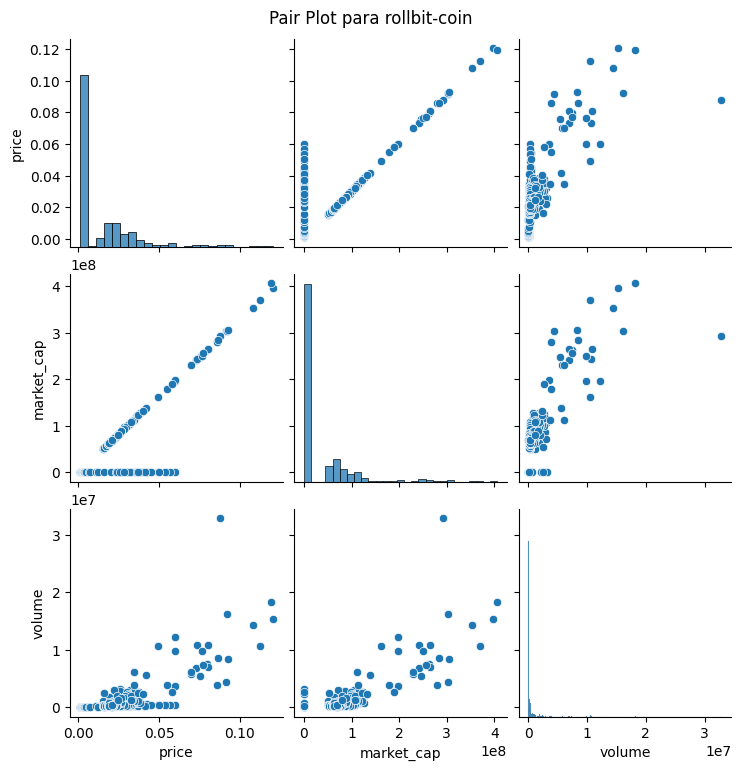

<Figure size 1000x600 with 0 Axes>

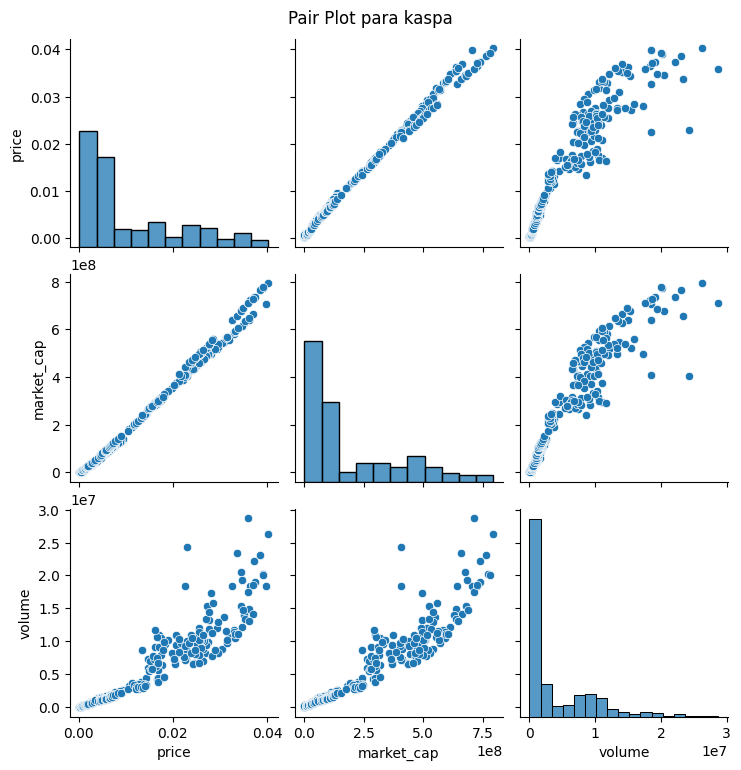

<Figure size 1000x600 with 0 Axes>

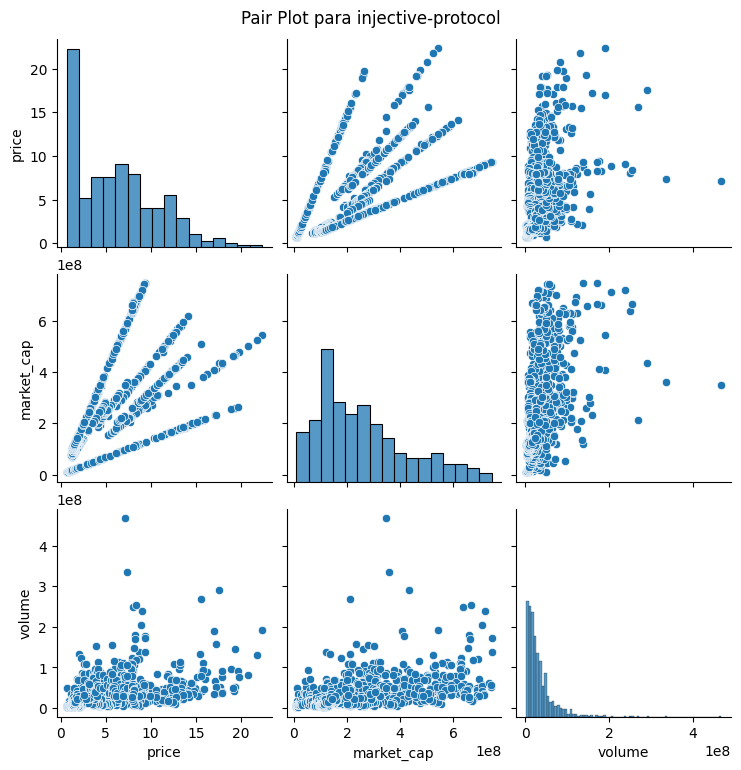

<Figure size 1000x600 with 0 Axes>

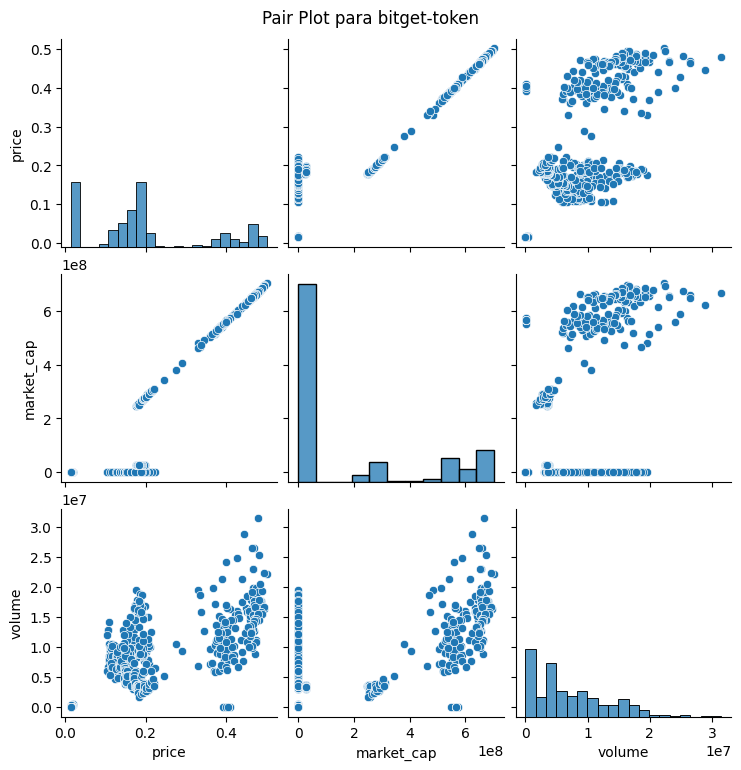

<Figure size 1000x600 with 0 Axes>

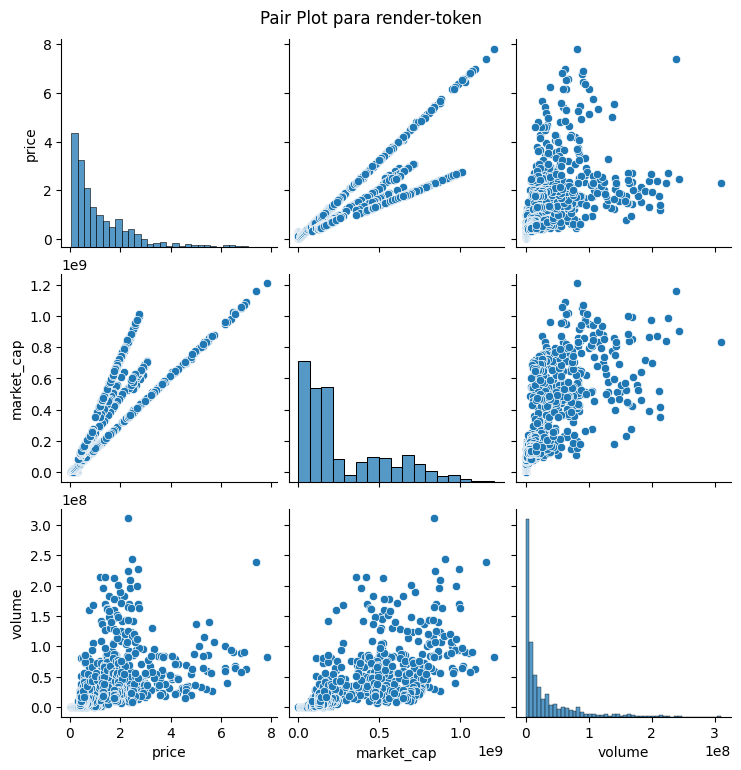

<Figure size 1000x600 with 0 Axes>

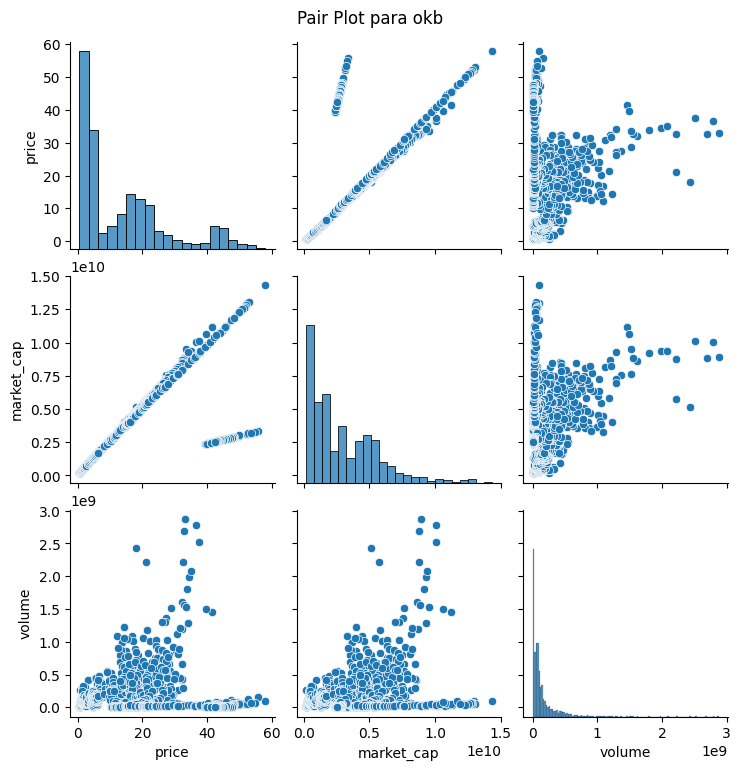

<Figure size 1000x600 with 0 Axes>

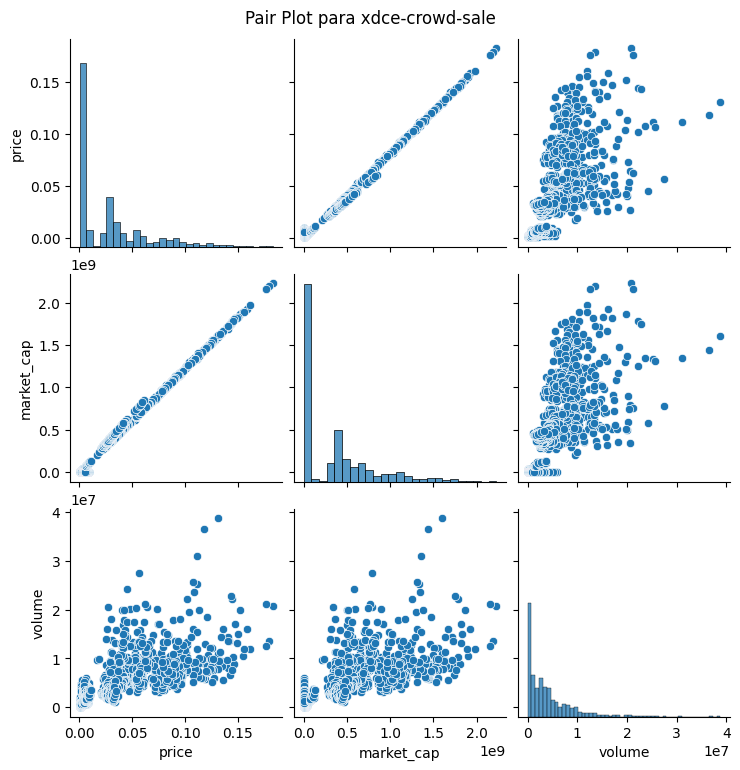

<Figure size 1000x600 with 0 Axes>

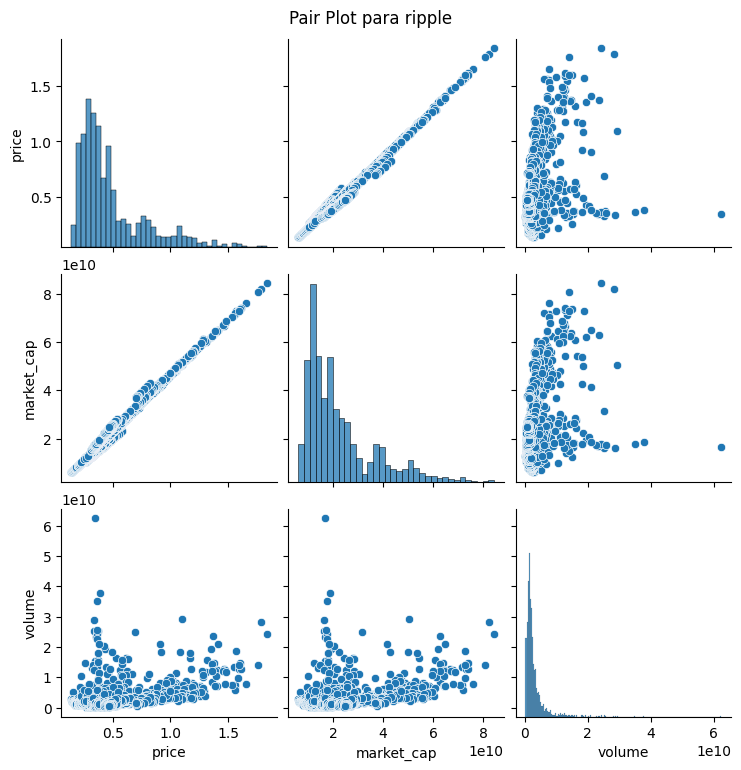

<Figure size 1000x600 with 0 Axes>

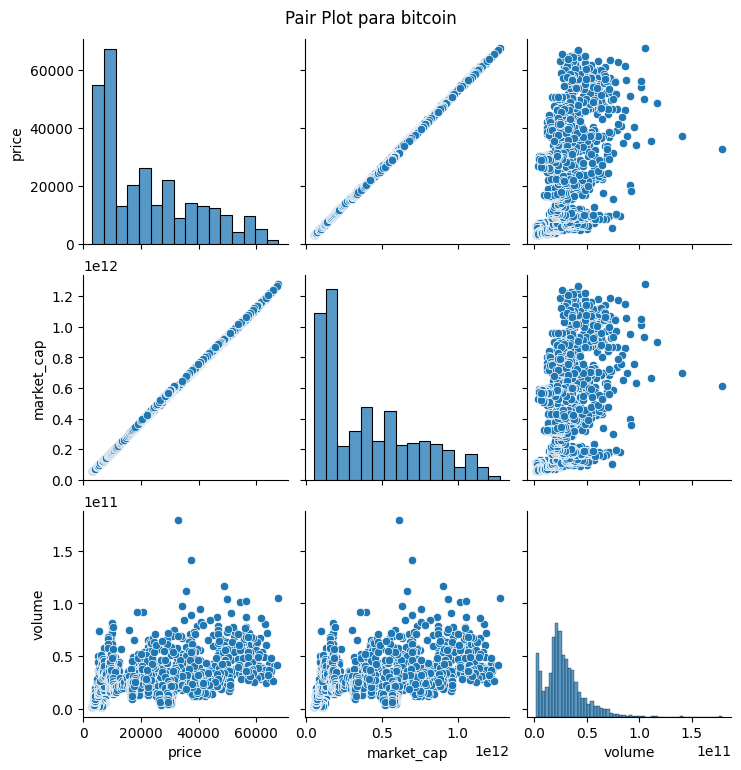

<Figure size 1000x600 with 0 Axes>

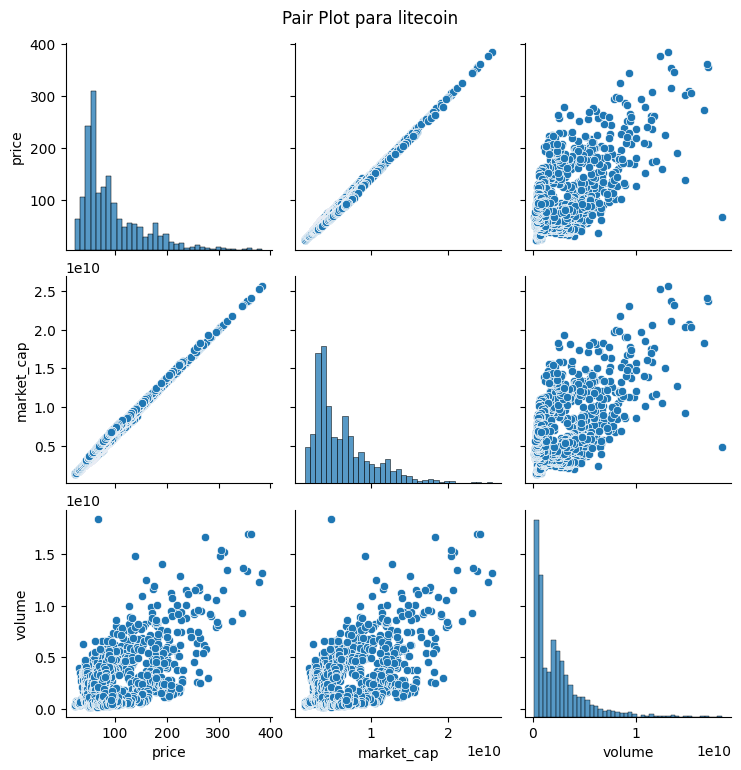

In [456]:
for coin_id, coin_df in dfs_by_coin.items():
    plt.figure(figsize=(10, 6))
    sns.pairplot(coin_df)
    plt.suptitle(f'Pair Plot para {coin_id}', y=1.02)
    plt.show()

- De los gráficos anteriores podemos concluir que en la mayoría de las monedas (bitcoin, rollbit-coin,okb, ripple, xdce, litecoin, bitget-token, kaspa) el market_cap se comporta de manera lineal con respecto al precio.

- En las monedas render-token e injective-protocol la relación entre market_cap y precio no es del todo lineal pero si podemos ver una tendencia

- En cuanto al volumen de transacciones, solo en algunas monedas (litecoin, kaspa) se ve una relación lineal o cierto patrón que muestra aumento del volumen con el aumento de precio

#### A continuación veremos las correlaciones entre las variables

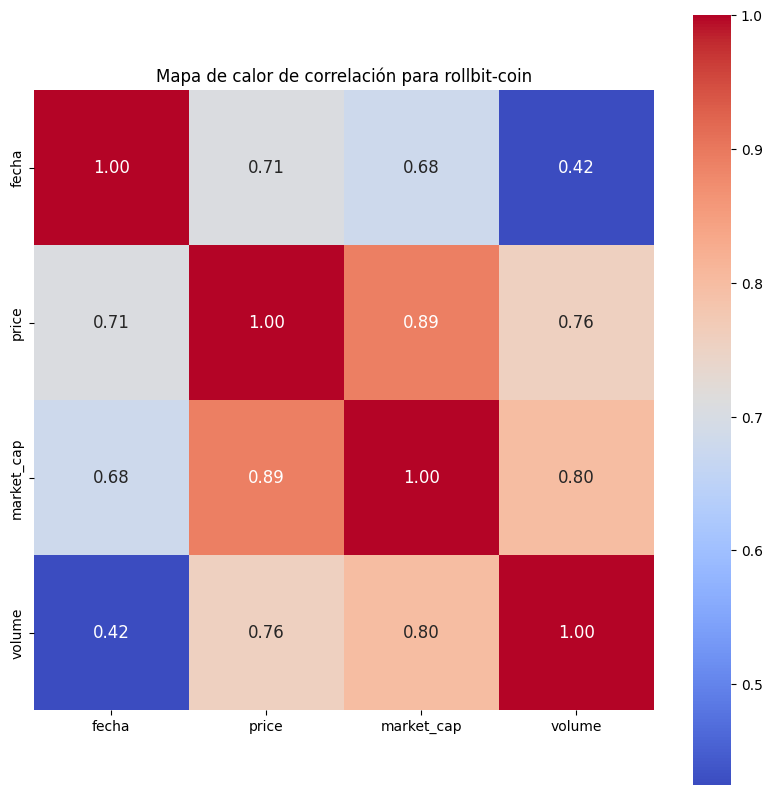

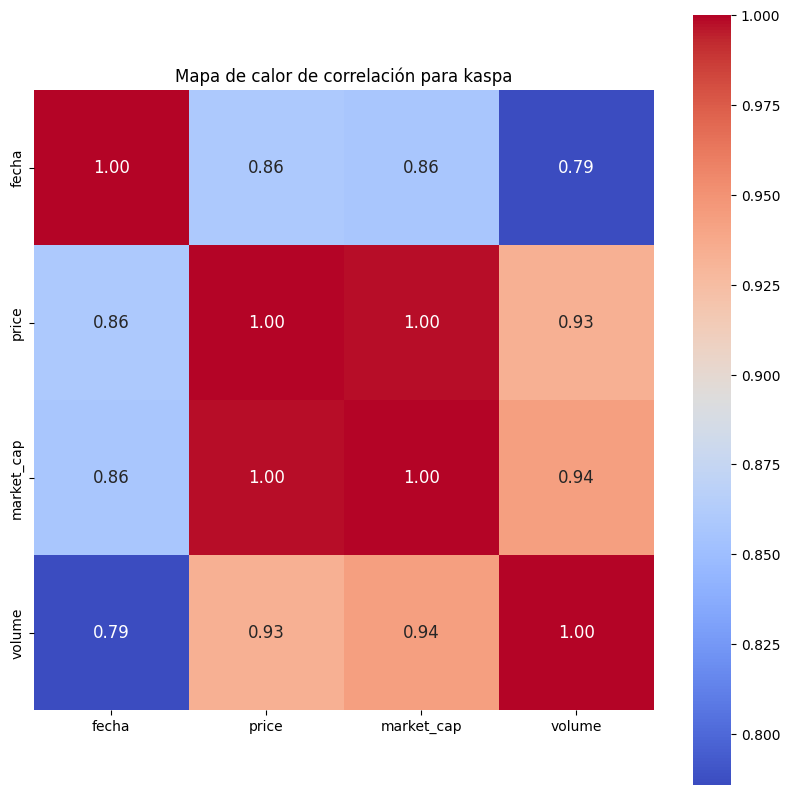

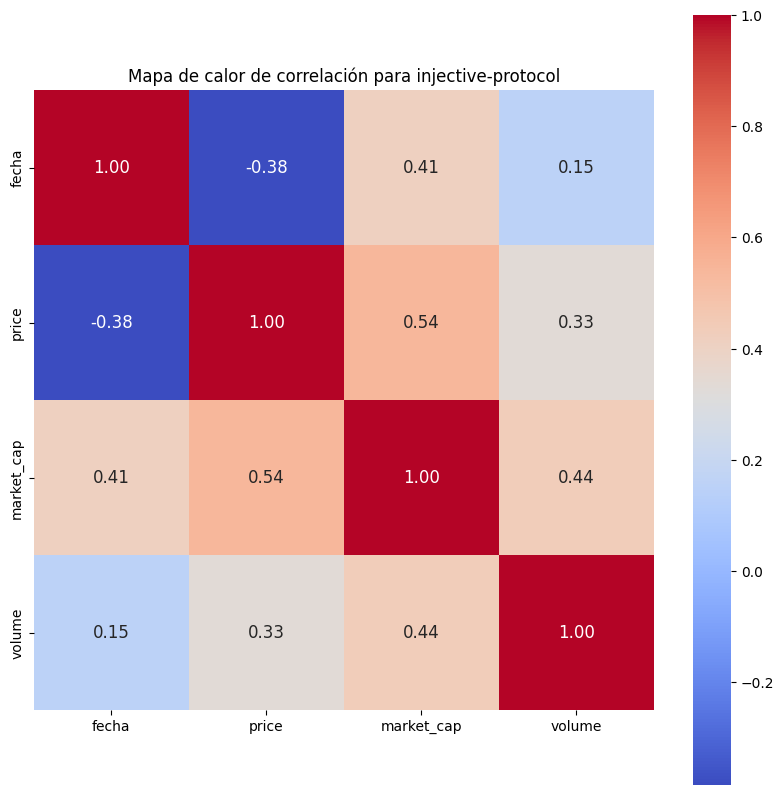

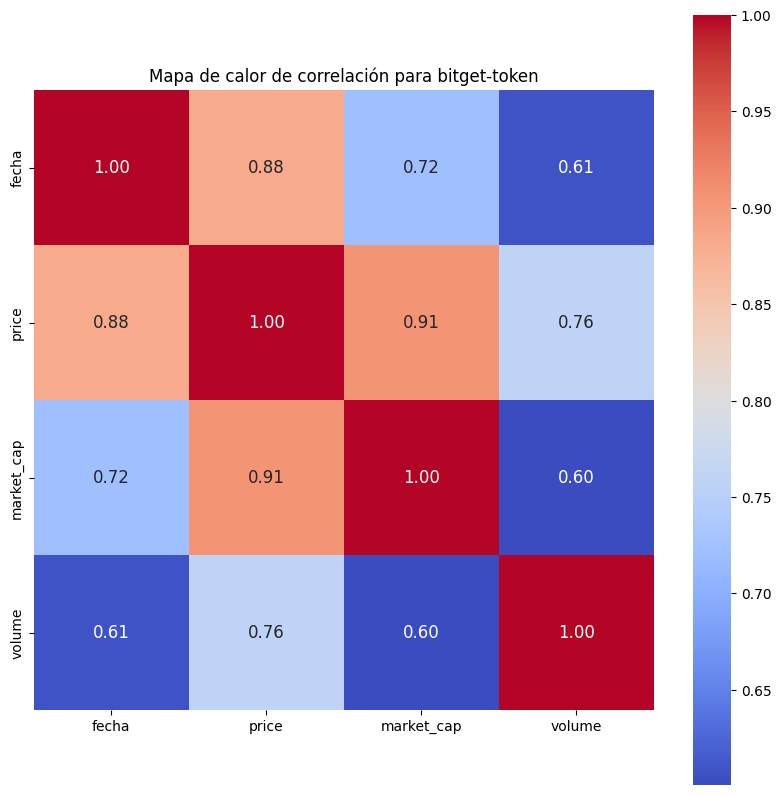

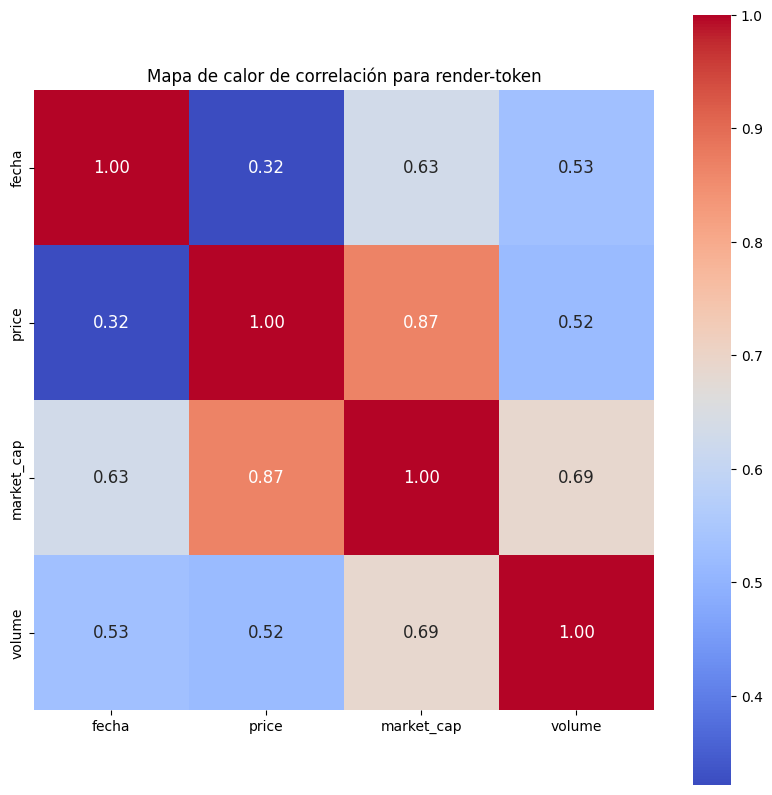

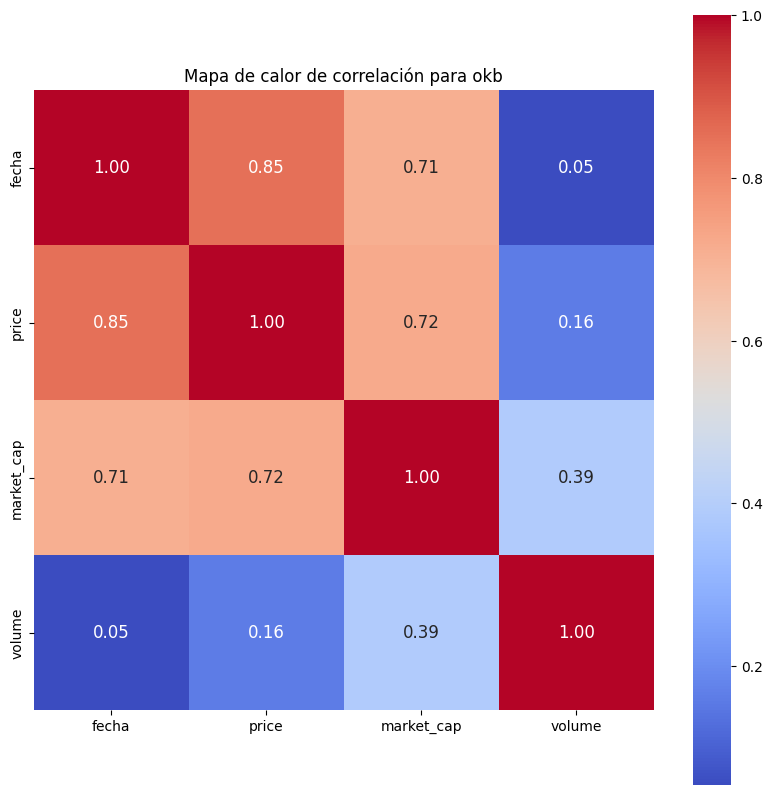

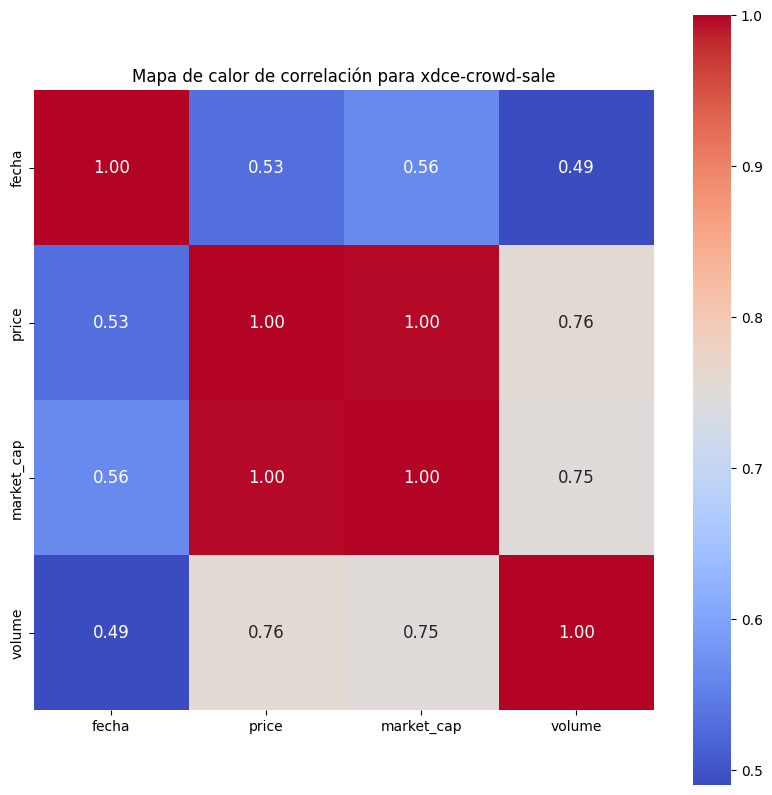

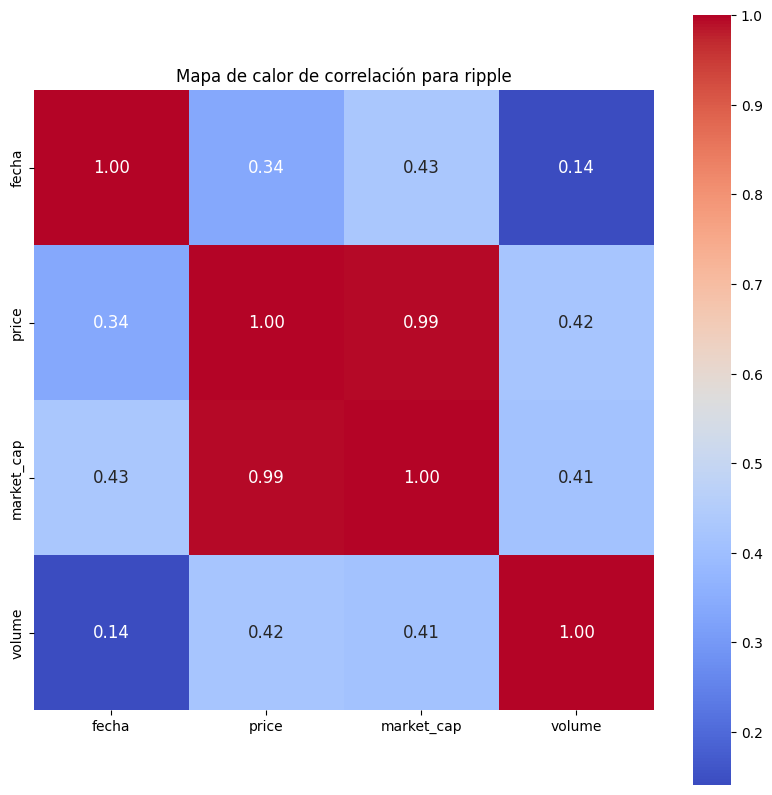

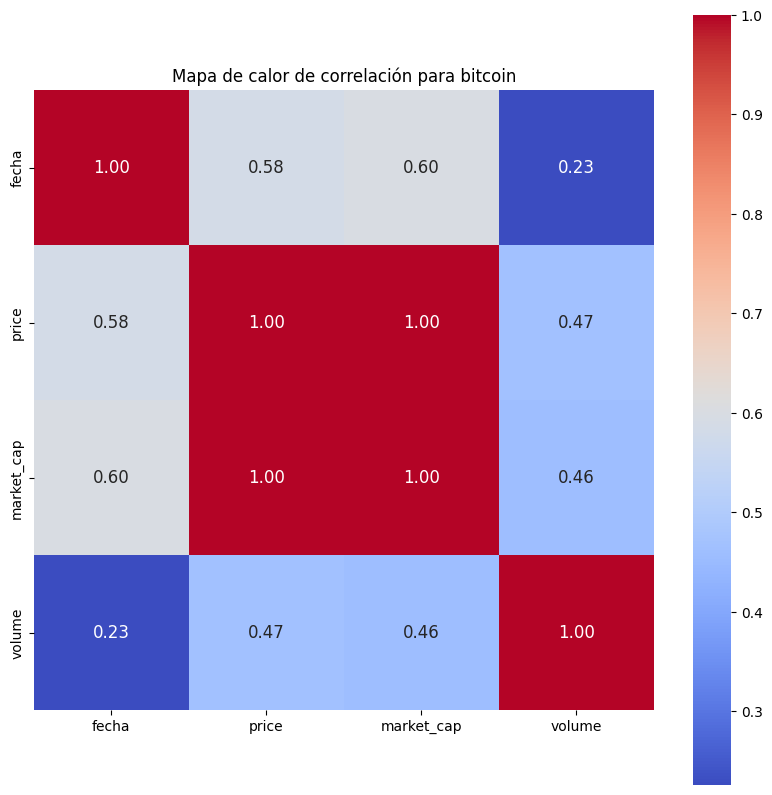

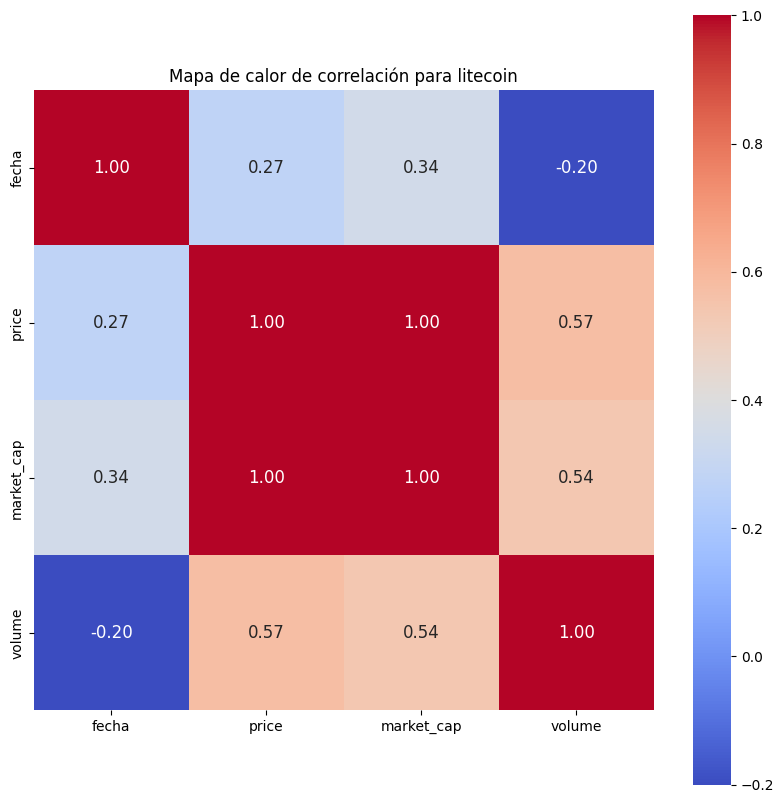

In [458]:
for coin_id, coin_df in dfs_by_coin.items():
    corr = coin_df.corr()
    plt.figure(figsize=(10, 10))
    sns.heatmap(corr, cbar=True, square=True, annot=True, fmt='.2f', annot_kws={'size': 12},
                xticklabels=coin_df.columns,
                yticklabels=coin_df.columns,
                cmap='coolwarm')
    plt.title(f"Mapa de calor de correlación para {coin_id}")
    plt.show()

De los mapas de calor podemos sacar las siguientes conclusiones:

- Como vimos en los pairplots, las monedas bitcoin, litecoin, xdce, ripple y ripple la variable market_cap está correlacionada en un 100% con el precio

- En las monedas rollbit-coin, bitget-token, render-token y okb también se ve una fuerte correlación pero no del 100%, del orden entre 70% y 90% 

- En cuanto a la relación entre volumen y precio, solo vemos que la moneda kaspa presenta un 93%, en el resto la correlación es mucho menor, en algunos casos menores al 40% y en otros en el orden del 60%

- Se observa una moneda en el que no se ven fuertes correlaciones entre sus variables: injective-protocol

#### Filtramos el dataframe de all_coins quitando las variables que ya sabemos, están muy correlacionadas, de manera que podamos tener un dataframe más reducido para poder ver si existe correlacion entre las variables de moneda a moneda

In [461]:
columns_exclude  = ["rollbit-coin_market_cap","kaspa_market_cap","kaspa_volume","bitget-token_market_cap","render-token_market_cap","xdce-crowd-sale_market_cap","ripple_market_cap","bitcoin_market_cap","litecoin_market_cap_x"]

filtered_df = all_coins.drop(columns=columns_exclude)

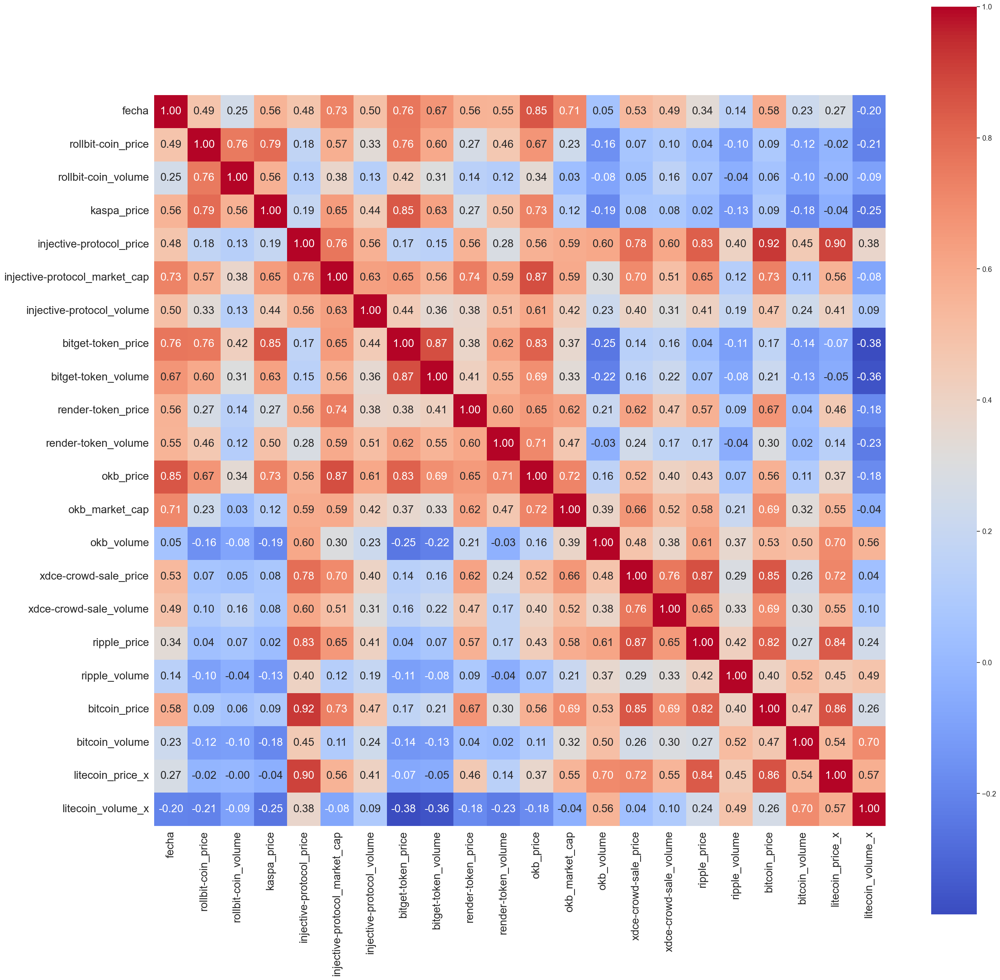

In [534]:
corr = filtered_df.corr()
plt.figure(figsize=(30, 30))
sns.heatmap(corr, cbar=True, square=True, annot=True, fmt='.2f',
            annot_kws={'size': 20},  # Ajusta aquí el tamaño de fuente
            xticklabels=filtered_df.columns,
            yticklabels=filtered_df.columns,
            cmap='coolwarm')
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
plt.show()

Podemos observar algunas correlaciones fuertes entre el precio de una moneda y otras:

- injective-litecoin-bitcoin (mas del 90%)
- injective-ripple-kaspa-bitgettoken-okb (entre 80% y 85%)
- ripple-bitcoin-litecoin (entre 80% y 85%)

#### Haremos un pairplot para observar patrones

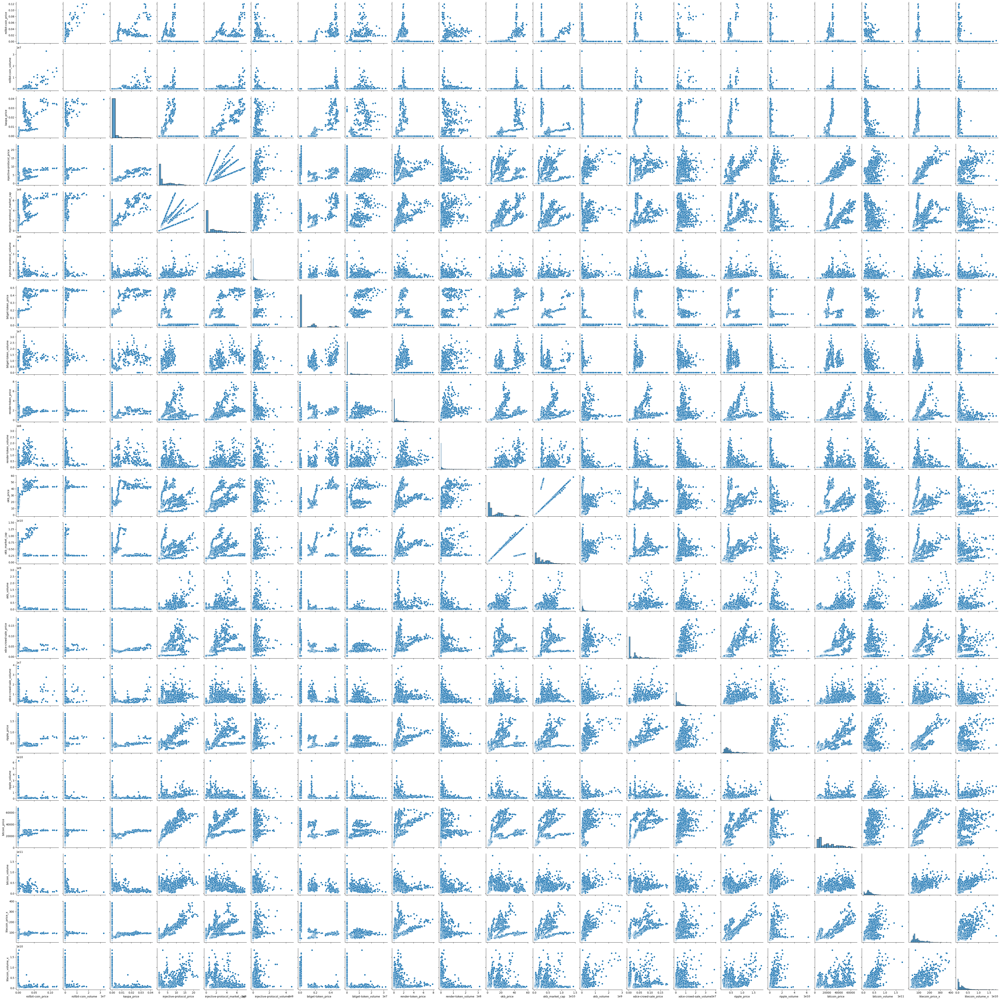

In [463]:
sns.pairplot(filtered_df)
plt.show()

Como en este pairplot no se logran apreciar bien los patrones, vamos a hacer una seleccion de solo los precios de las
monedas para poder ver correlación de precios entre distintas monedas

In [ ]:
columns = ["rollbit-coin_price","kaspa_price","injective-protocol_price","bitget-token_price","render-token_price","okb_price","xdce-crowd-sale_price","ripple_price","bitcoin_price","litecoin_price_x"]

price_df = filtered_df[columns]

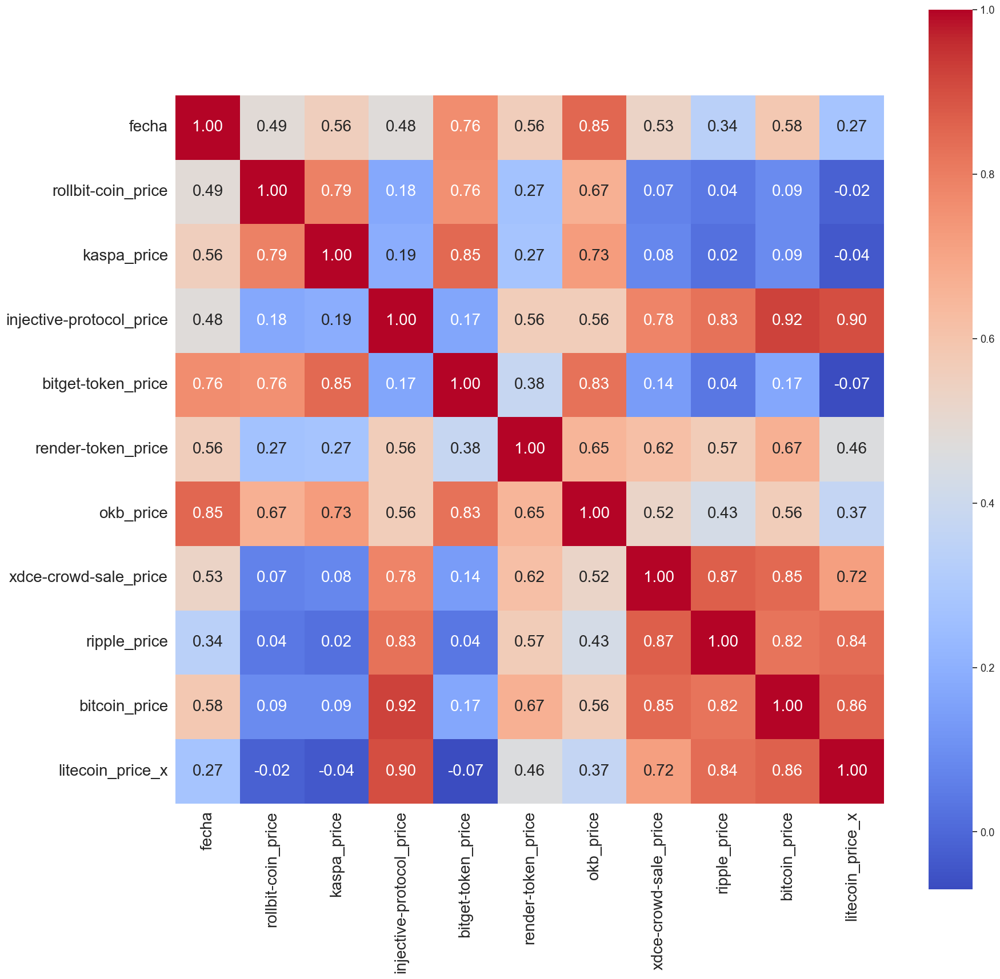

In [532]:
# Heatmap de precios de las distintas criptomendas
corr = price_df.corr()
plt.figure(figsize=(20,20))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 20},
           xticklabels= price_df.columns,
           yticklabels= price_df.columns,
           cmap= 'coolwarm')
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
plt.show()

Aqui se ve más claramente lo que mencionabamos anteriormente sobre las correlaciones de precios entre monedas, entonces tenemos:

- En el orden de 80%-85% de correlación de precios: bitcoin-ripple-litecoin-xdce y kaspa-bitgettoken
- Mas del 90% de correlación de precios entre: injective-bitcoin-litecoin

#### Pariplot de precios 

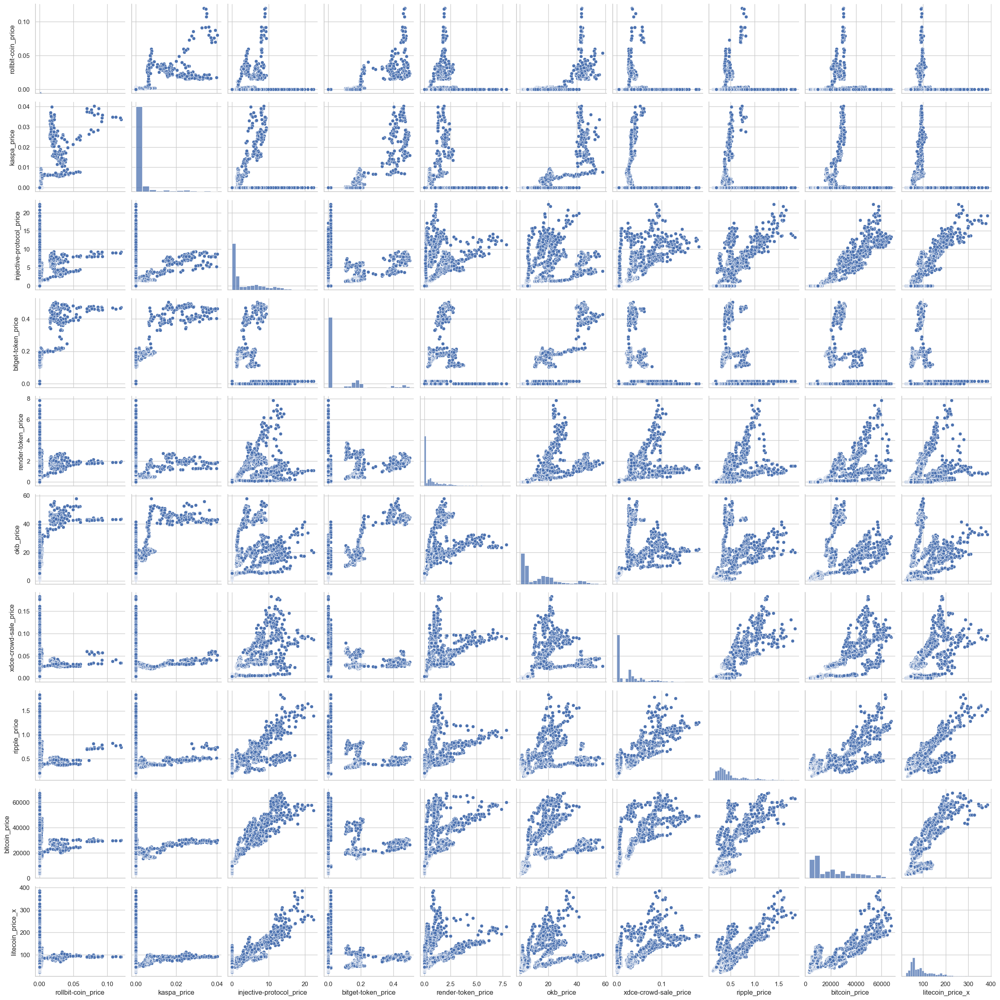

In [520]:
sns.pairplot(price_df)
sns.set(font_scale=1.2)
plt.show()

No se pueden observar patrones perfectamente lineales, pero si en las monedas que tienen mayor correlación de precio (injective-litecoin-bitcoin) tiende a tener un comportamieto más lineal que el resto

#### Repetimos el proceso pero para los datos de market_cap de cada moneda

In [469]:
columns = ["fecha","rollbit-coin_market_cap","kaspa_market_cap","injective-protocol_market_cap","bitget-token_market_cap","render-token_market_cap","okb_market_cap","xdce-crowd-sale_market_cap","ripple_price","bitcoin_market_cap","litecoin_market_cap_x"]

marketcap_df = all_coins[columns]

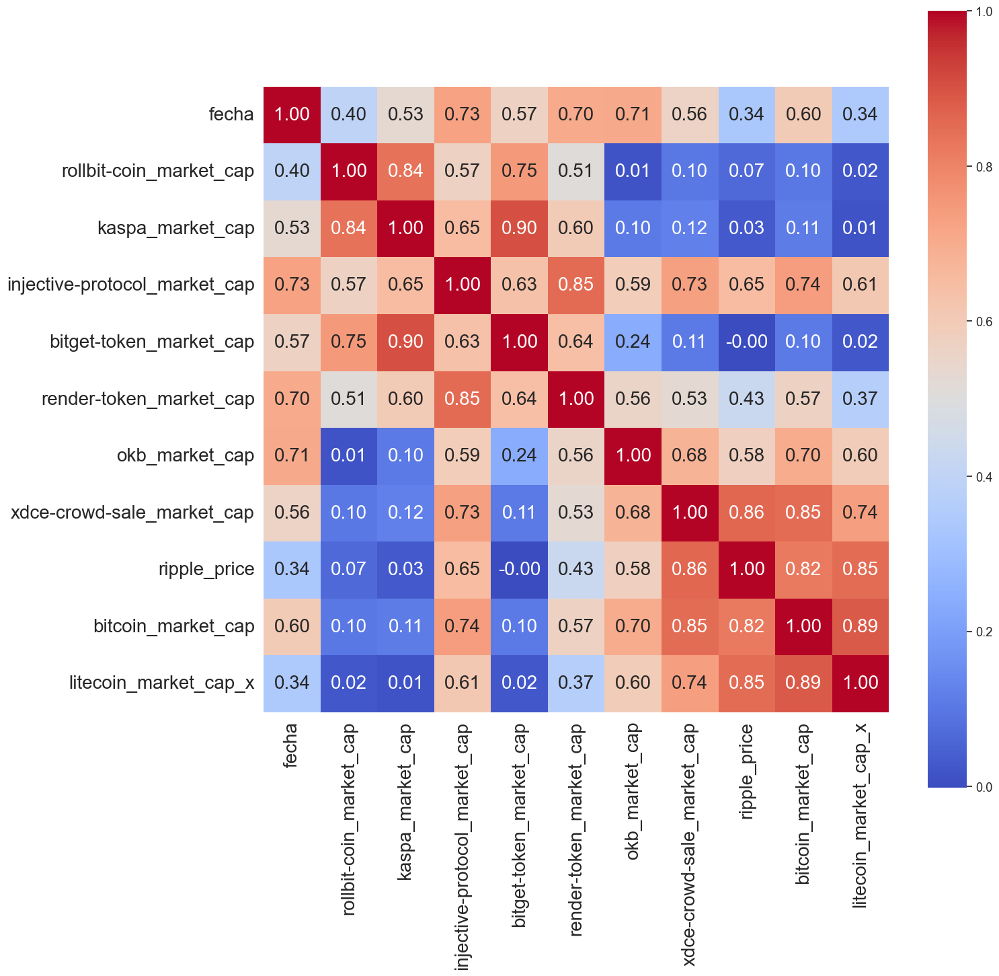

In [536]:
# Heatmap de marketcap de las distintas criptomendas
corr = marketcap_df.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr, cbar = True,  square = True, annot=True, fmt= '.2f',annot_kws={'size': 20},
           xticklabels= marketcap_df.columns,
           yticklabels= marketcap_df.columns,
           cmap= 'coolwarm')
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)
plt.show()

Como era de esperarse, son las mismas monedas las que tienen fuerte correlación entre sus market_cap, esto se debe a que casi todas las monedas tienen fuerte correlación entre el movimiento de sus precios y market_cap, lo cual, por ende se ve en el resultado al correlacionar los market_cap de las distinas monedas

#### Ahora analizaremos como están distribuidas estas monedas según la categoría/s a la/s que pertenecen

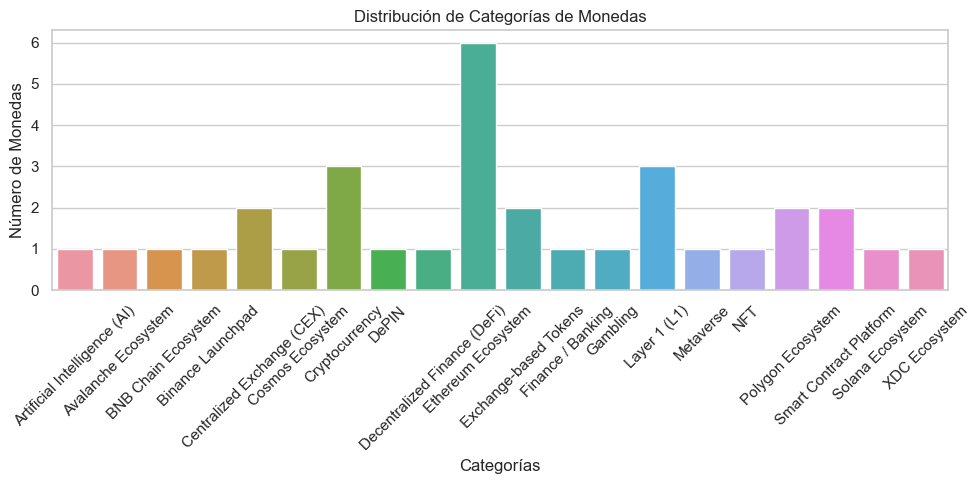

In [517]:
# Cuenta las ocurrencias de cada categoría
category_counts = market_exploded['categories'].value_counts()

# Crea un gráfico de barras utilizando Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x=category_counts.index, y=category_counts.values)
plt.xticks(rotation=45)  # Rota las etiquetas del eje x para mejorar la legibilidad
plt.xlabel('Categorías')
plt.ylabel('Número de Monedas')
plt.title('Distribución de Categorías de Monedas')
plt.tight_layout()
plt.show()

Se puede observar que la mayoría de las monedas (6) perteneces al **Ecosistema de Ethereum** y en menor medida (3) a la categoría de **Cryptocurrency** y **Layer 1 (L1)**

#### Por último, revisaremos en que ranking se encuentran de acuerdo a su market_cap, este ranking se basa en las 10000 cryptomonedas existentes

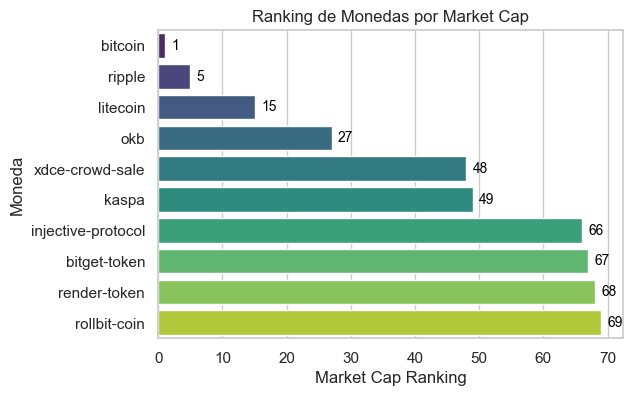

In [542]:
sns.set(style="whitegrid")
plt.figure(figsize=(6, 4))
ax = sns.barplot(x='market_cap_rank', y='id', data=market, palette="viridis", order=market['id'])

for index, row in market.iterrows():
    ax.text(row['market_cap_rank'] + 1, index, f"{row['market_cap_rank']}", va='center', fontsize=10, color='black')

plt.xlabel('Market Cap Ranking')
plt.ylabel('Moneda')
plt.title('Ranking de Monedas por Market Cap')
plt.show()

Se puede ver, y tiene sentido, que estas 10 cryptomonedas que generaron mayores ganancias el pasado año, están en el top 100 del raniking de market_cap, siendo 2 del top_10 y 3 del top_50